#Thông tin sinh viên
- Họ tên: Nguyễn Thị Như Vân
- MSSV: 20520855
- Bài tập 2: 24/10/2022

# Kết nối với Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import thư viện

In [2]:
import tensorflow as tf
import tensorflow_hub as hub

import matplotlib.pyplot as plt
import numpy as np

from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

In [3]:
import cv2
from google.colab.patches import cv2_imshow

In [4]:
import torch
import os
import numpy as np	

In [5]:
import glob

# Yêu cầu 1
- Cài đặt và sử dụng Faster-RCNN
- Thử nghiệm cho 5 ảnh: pedestrian
- Cho biết pedestrian-05 có bao nhiêu person ?
- Xác định confiden score để xác định ít nhất 2 ảnh camourflage, 2 ảnh lính_bắn_tỉa


In [6]:
!pip install pyyaml==5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
!pip uninstall torch

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addmv_native.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addmv_ops.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_compositeexplicitautograd_dispatch.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_compositeimplicitautograd_dispatch.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_cpu_dispatch.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_cuda_dispatch.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_native.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/addr_ops.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/adjoint.h
    /usr/local/lib/python3.7/dist-packages/torch/include/ATen/ops/adjoint_compositeimplic

In [8]:
!pip install torch==1.7.1+cu101 torchvision==0.8.2+cu101 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Using cached https://download.pytorch.org/whl/cu101/torch-1.7.1%2Bcu101-cp37-cp37m-linux_x86_64.whl (735.4 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.7.1+cu101 which is incompatible.


In [9]:
print(torch.__version__)
print(torch.cuda.is_available())

1.7.1+cu101
True


In [10]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
     |████████████████████████████████| 6.1 MB 609 kB/s 
     |████████████████████████████████| 79 kB 8.2 MB/s 
     |████████████████████████████████| 130 kB 68.6 MB/s 
     |████████████████████████████████| 151 kB 64.9 MB/s 
     |████████████████████████████████| 50 kB 7.6 MB/s 
     |████████████████████████████████| 843 kB 58.8 MB/s 
     |████████████████████████████████| 117 kB 75.2 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=1719e1cf8b06444d1f724cd9327c26a440ea379382e333dad9068f7bbdf51570
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=c83217bedaab1823c93

In [11]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

import time

In [12]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml'))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml')


cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25

## Pedestrian

model_final_68b088.pkl: 421MB [00:10, 41.1MB/s]                           
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.7/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


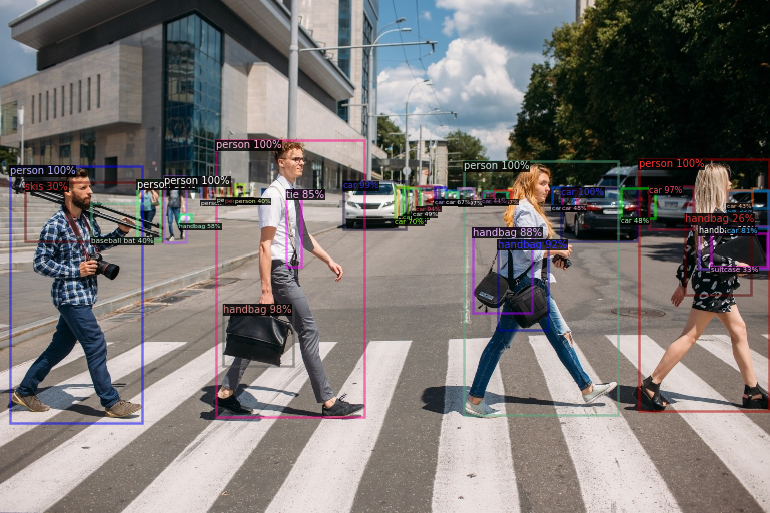

In [13]:
import glob
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/Pedestrian_01.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

In [14]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/Pedestrian_02.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

Output hidden; open in https://colab.research.google.com to view.

In [15]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-03.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-04.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

Output hidden; open in https://colab.research.google.com to view.

In [16]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-05.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

Output hidden; open in https://colab.research.google.com to view.

## Camourflage

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


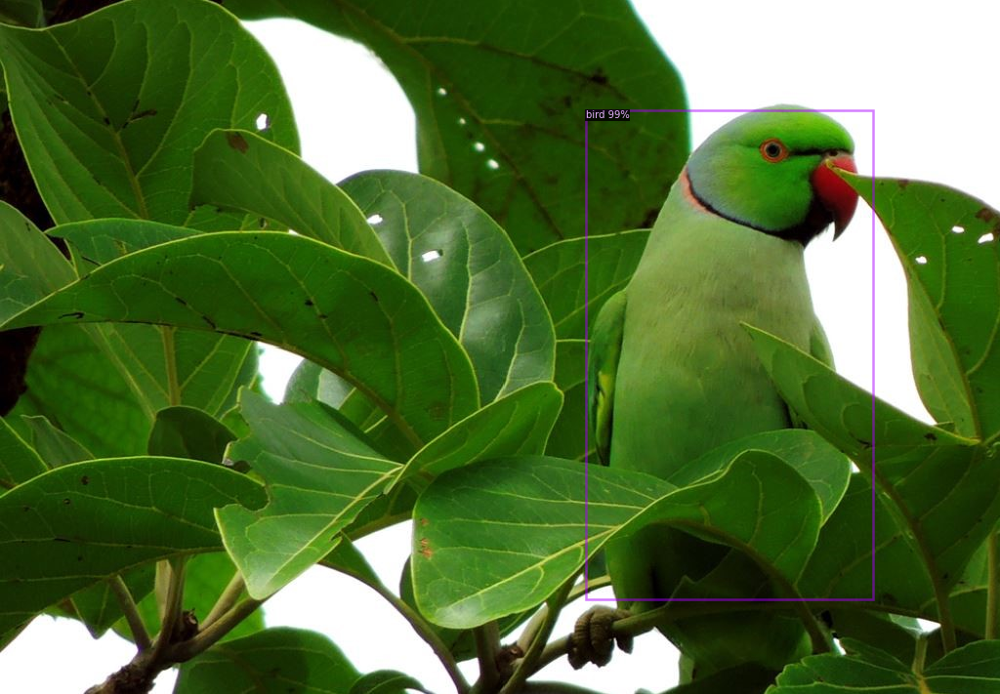

In [17]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/camourflage_00473.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

In [18]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/camourflage_00470.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

Output hidden; open in https://colab.research.google.com to view.

## Lính bắn tỉa

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


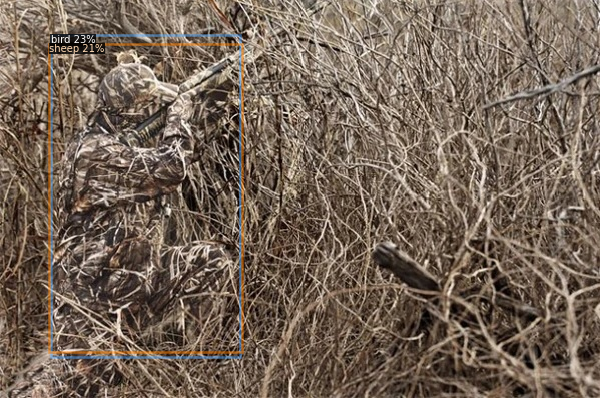

In [ ]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/linh-ban-tia-2.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


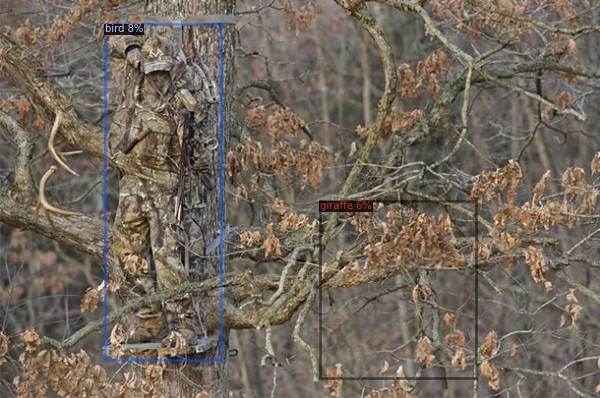

In [19]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/linh-ban-tia-3.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


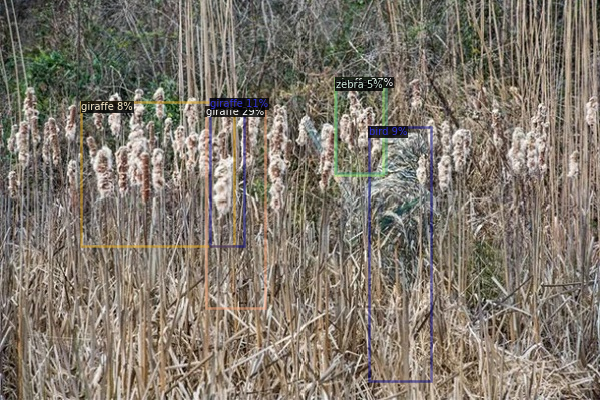

In [20]:
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/linh-ban-tia-4.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
    cv2_imshow(output.get_image()[:,:,::-1])

# Yêu cầu 2
- Cài đặt và sử dụng Yolo
- Thử nghiệm cho 5 ảnh: pedestrian
- Cho biết pedestrian-05 có bao nhiêu person ?
- Xác định confiden score để xác định ít nhất 2 ảnh camourflage, 2 ảnh lính_bắn_tỉa


In [6]:
!git clone https://github.com/ultralytics/yolov5 

Cloning into 'yolov5'...
remote: Enumerating objects: 14379, done.
remote: Total 14379 (delta 0), reused 0 (delta 0), pack-reused 14379
Receiving objects: 100% (14379/14379), 13.26 MiB | 26.07 MiB/s, done.
Resolving deltas: 100% (9951/9951), done.


In [7]:
!pip install -r yolov5/requirements.txt 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.1 MB/s 


In [8]:
model = torch.hub.load('ultralytics/yolov5','yolov5s')

/usr/local/lib/python3.7/dist-packages/torch/hub.py:267: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  "You are about to download and run code from an untrusted repository. In a future release, this won't "
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2022-10-24 Python-3.7.15 torch-1.12.1+cu113 CPU



  0%|          | 0.00/14.1M [00:00<?, ?B/s]


Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


## Pedestrian

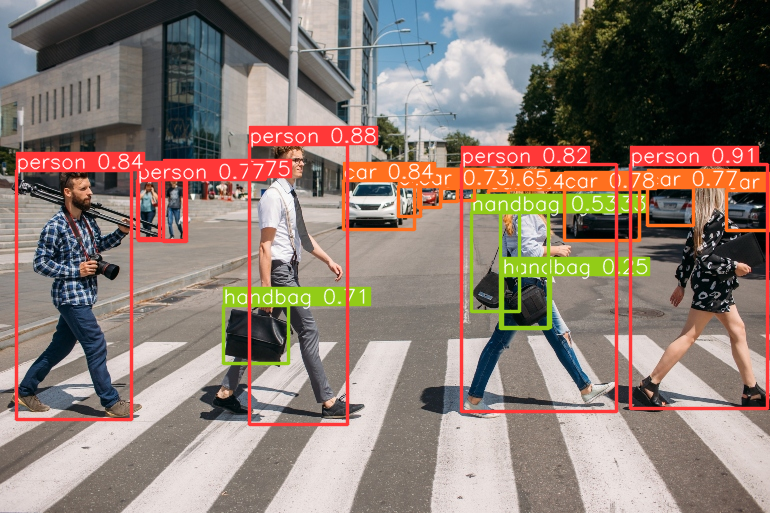

In [ ]:
img_1 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/Pedestrian_01.jpg")
res_1 = model(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
res_1.show()

In [9]:
img_2 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/Pedestrian_02.jpg")
res_2 = model(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))
res_2.show()

Output hidden; open in https://colab.research.google.com to view.

In [10]:
img_3 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-03.jpg")
res_3 = model(cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB))
res_3.show()

Output hidden; open in https://colab.research.google.com to view.

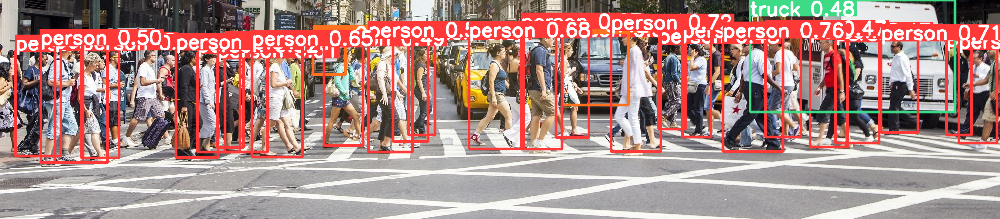

In [ ]:
img_4 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-04.jpg")
res_4 = model(cv2.cvtColor(img_4, cv2.COLOR_BGR2RGB))
res_4.show()

In [11]:
img_5 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-05.jpg")
res_5 = model(cv2.cvtColor(img_5, cv2.COLOR_BGR2RGB))
res_5.show()

Output hidden; open in https://colab.research.google.com to view.

Số person trong pedestrian-05

In [12]:
res_5.print()

image 1/1: 1240x3000 21 persons, 5 cars, 1 traffic light, 1 backpack, 1 umbrella, 1 handbag
Speed: 3.7ms pre-process, 239.2ms inference, 2.2ms NMS per image at shape (1, 3, 288, 640)


## Camourflage

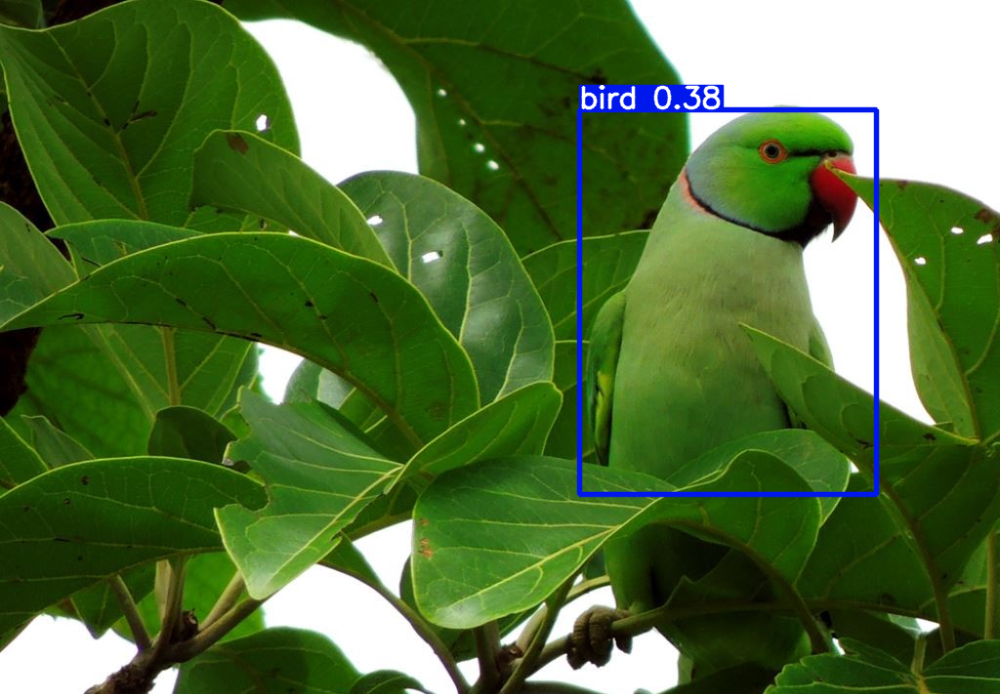

In [ ]:
cmf_1 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/camourflage_00473.jpg")
res_cmf_1 = model(cv2.cvtColor(cmf_1, cv2.COLOR_BGR2RGB))
res_cmf_1.show()

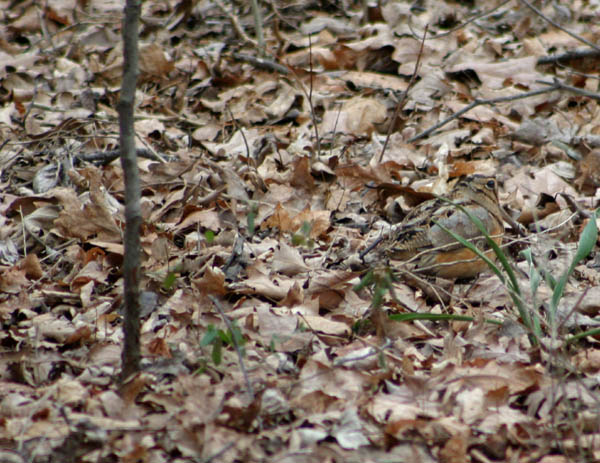

In [ ]:
cmf_2 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/camourflage_00496.jpg")
res_cmf_2 = model(cv2.cvtColor(cmf_2, cv2.COLOR_BGR2RGB))
res_cmf_2.show()

## Lính bắn tỉa

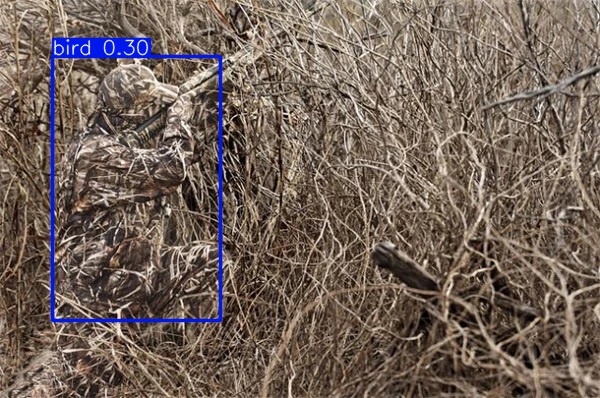

In [ ]:
lbt_1 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/linh-ban-tia-2.jpg")
res_lbt_1 = model(cv2.cvtColor(lbt_1, cv2.COLOR_BGR2RGB))
res_lbt_1.show()

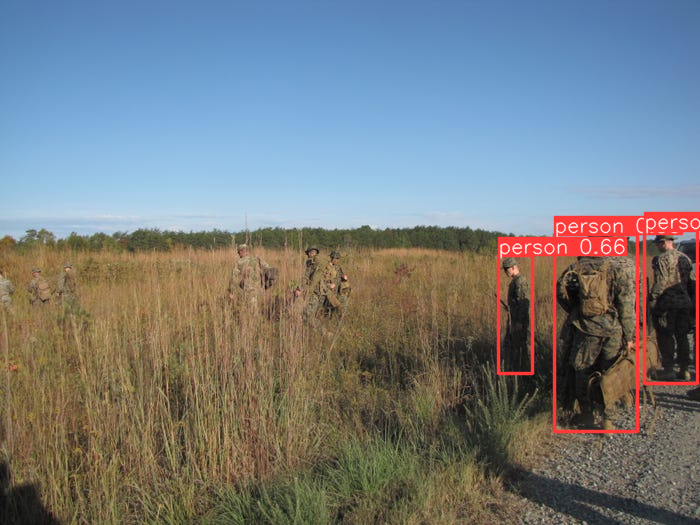

In [ ]:
lbt_2 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/linh-ban-tia-5.jpg")
res_lbt_2 = model(cv2.cvtColor(lbt_2, cv2.COLOR_BGR2RGB))
res_lbt_2.show()

# Yêu cầu 3
So sánh thời gian detect của Faster-RCNN và Yolo trên cùng 1 ảnh pedestrian-05.jpg

In [21]:
start = time.time()
for i in sorted(glob.glob('/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-05.jpg')):
    image = cv2.imread(i)
    predictor = DefaultPredictor(cfg)
    output = predictor(image)
    viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(output['instances'].to('cpu'))
end = time.time()
print("Faster RCNN's detection time: ", end - start)

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


Faster RCNN's detection time:  5.115630626678467


In [17]:
img_5 = cv2.imread("/content/drive/MyDrive/CS331.N12.KHCL/Baitap/Baitap2/images/pedestrian-05.jpg")
res_5 = model(cv2.cvtColor(img_5, cv2.COLOR_BGR2RGB))
res_5.print()

image 1/1: 1240x3000 21 persons, 5 cars, 1 traffic light, 1 backpack, 1 umbrella, 1 handbag
Speed: 3.6ms pre-process, 224.3ms inference, 1.7ms NMS per image at shape (1, 3, 288, 640)
